In [444]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
%matplotlib inline
import altair as alt
from scipy.stats import norm   #for sns.distplot
#alt.renderers.enable('default')
alt.renderers.enable('notebook');

In [445]:
immo = pd.read_csv("immo_data.csv")
pd.set_option("display.max_rows", 50) 
pd.set_option("display.max_columns", 48)

In [446]:
immo.shape

(198379, 48)

In [447]:
immo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 198379 entries, 0 to 198378
Data columns (total 48 columns):
regio1                      198379 non-null object
serviceCharge               193267 non-null float64
heatingType                 165769 non-null object
telekomTvOffer              174578 non-null object
telekomHybridUploadSpeed    36865 non-null float64
newlyConst                  198379 non-null bool
balcony                     198379 non-null bool
electricityBasePrice        47185 non-null float64
picturecount                198379 non-null int64
pricetrend                  197158 non-null float64
telekomUploadSpeed          174011 non-null float64
totalRent                   168609 non-null float64
yearConstructed             156077 non-null float64
electricityKwhPrice         47185 non-null float64
scoutId                     198379 non-null int64
noParkSpaces                67939 non-null float64
firingTypes                 156528 non-null object
hasKitchen             

In [448]:
immo.describe()

,serviceCharge,telekomHybridUploadSpeed,electricityBasePrice,picturecount,pricetrend,telekomUploadSpeed,totalRent,yearConstructed,electricityKwhPrice,scoutId,noParkSpaces,yearConstructedRange,baseRent,livingSpace,baseRentRange,geo_plz,noRooms,thermalChar,floor,numberOfFloors,noRoomsRange,livingSpaceRange,heatingCosts,lastRefurbish
count,193267.000000,36865.0,47185.000000,198379.000000,197158.000000,174011.000000,1.686090e+05,156077.000000,47185.000000,1.983790e+05,67939.000000,156077.000000,1.983790e+05,198379.000000,198379.000000,198379.000000,198379.000000,121087.000000,160758.000000,126567.000000,198379.000000,198379.000000,63195.000000,59275.000000
mean,151.432797,10.0,89.101680,9.718146,3.435083,27.785563,9.173050e+02,1966.242880,0.199784,1.055148e+08,1.362148,3.681036,6.531439e+02,74.886019,3.719991,36701.341770,2.653179,115.225391,2.127260,3.571223,2.580313,3.078869,78.010274,2013.593758
std,352.894340,0.0,5.413495,6.348194,2.055462,16.655155,3.857550e+04,44.000102,0.009676,1.243641e+07,9.624268,2.718527,3.612985e+03,295.936458,2.212909,27716.121629,3.014791,62.089355,4.013986,6.349449,0.934116,1.405769,159.517925,10.112583
min,0.000000,10.0,71.430000,0.000000,-9.170000,1.000000,0.000000e+00,1000.000000,0.170500,2.887174e+07,0.000000,1.000000,0.000000e+00,0.000000,1.000000,852.000000,1.000000,0.100000,-1.000000,0.000000,1.000000,1.000000,0.000000,1015.000000
25%,95.000000,10.0,90.760000,6.000000,1.960000,10.000000,4.640000e+02,1948.000000,0.191500,1.060264e+08,1.000000,1.000000,3.320000e+02,54.500000,2.000000,9126.000000,2.000000,79.800000,1.000000,2.000000,2.000000,2.000000,55.000000,2012.000000
50%,135.000000,10.0,90.760000,9.000000,3.410000,40.000000,6.400000e+02,1972.000000,0.198500,1.102375e+08,1.000000,3.000000,4.800200e+02,67.500000,3.000000,38114.000000,3.000000,107.100000,2.000000,3.000000,3.000000,3.000000,70.000000,2017.000000
75%,189.000000,10.0,90.760000,13.000000,4.660000,40.000000,9.710000e+02,1996.000000,0.205500,1.119709e+08,1.000000,5.000000,7.900000e+02,87.000000,5.000000,55606.000000,3.000000,141.000000,3.000000,4.000000,3.000000,4.000000,90.000000,2018.000000
max,146118.000000,10.0,90.760000,109.000000,14.920000,100.000000,1.575154e+07,2090.000000,0.227600,1.138739e+08,2241.000000,9.000000,1.234567e+06,111111.000000,9.000000,99998.000000,999.990000,1996.000000,999.000000,999.000000,5.000000,7.000000,12613.000000,2919.000000


In [450]:
immo.duplicated().value_counts() #no duplicates 

False    198379
dtype: int64

In [451]:
immo.dtypes

regio1                       object
serviceCharge               float64
heatingType                  object
telekomTvOffer               object
telekomHybridUploadSpeed    float64
newlyConst                     bool
balcony                        bool
electricityBasePrice        float64
picturecount                  int64
pricetrend                  float64
telekomUploadSpeed          float64
totalRent                   float64
yearConstructed             float64
electricityKwhPrice         float64
scoutId                       int64
noParkSpaces                float64
firingTypes                  object
hasKitchen                     bool
geo_bln                      object
cellar                         bool
yearConstructedRange        float64
baseRent                    float64
houseNumber                  object
livingSpace                 float64
geo_krs                      object
condition                    object
interiorQual                 object
petsAllowed                 

In [457]:
to_drop=['telekomTvOffer','geo_bln','geo_krs','telekomHybridUploadSpeed','electricityBasePrice', 'electricityKwhPrice','noParkSpaces','petsAllowed','thermalChar','numberOfFloors','heatingCosts','energyEfficiencyClass','lastRefurbish']

In [459]:
immo.drop(columns=to_drop, inplace=True)

In [460]:
immo['regio1'].value_counts().count() #it obviously represents the federal states

16

In [461]:
immo['regio2'].value_counts().count()

419

In [462]:
immo['regio3'].value_counts().count()

8159

In [463]:
immo['date'].value_counts()

May19    78068
Oct19    73131
Sep18    47180
Name: date, dtype: int64

## Our Data-Source provides us the information, that the webscraping was done on the following 3 days:
###  2018-09-22, 2019-05-10 and 2019-10-08. 
#### So we replace our values accordingly, to obtain them in daytime-format:
$$Sep18 \rightarrow 2018-09-22$$
$$Oct19 \rightarrow 2019-10-08$$
$$May19 \rightarrow 2019-05-10$$

In [465]:
immo['date'].replace({'Sep18':'2018-09-22', 'Oct19':'2019-10-08', 'May19':'2019-05-10'},inplace=True)
immo['date']=pd.to_datetime(immo['date'])

In [466]:
immo['heatingType'].value_counts()

central_heating                   96154
district_heating                  18310
gas_heating                       14638
self_contained_central_heating    14186
floor_heating                     12597
oil_heating                        3700
heat_pump                          1920
combined_heat_and_power_plant      1520
night_storage_heater               1009
wood_pellet_heating                 687
electric_heating                    665
stove_heating                       263
solar_heating                       120
Name: heatingType, dtype: int64

In [467]:
immo.isna().sum()

regio1                      0
serviceCharge            5112
heatingType             32610
newlyConst                  0
balcony                     0
picturecount                0
pricetrend               1221
telekomUploadSpeed      24368
totalRent               29770
yearConstructed         42302
scoutId                     0
firingTypes             41851
hasKitchen                  0
cellar                      0
yearConstructedRange    42302
baseRent                    0
houseNumber             52233
livingSpace                 0
condition               50331
interiorQual            83022
streetPlain             52228
lift                        0
baseRentRange               0
typeOfFlat              27577
geo_plz                     0
noRooms                     0
floor                   37621
noRoomsRange                0
garden                      0
livingSpaceRange            0
regio2                      0
regio3                      0
description             14829
facilities

In [468]:
immo=immo.assign(rent_per_sqm=immo['baseRent']/immo['livingSpace'])

# Barplot

In [469]:
immo['regio1'].value_counts()
immo['regio1'].replace({'Nordrhein_Westfalen':'Nordrhein-Westfalen', 'Sachsen_Anhalt':'Sachsen-Anhalt','Baden_Württemberg':'Baden-Württemberg','Rheinland_Pfalz':'Rheinland-Pfalz','Schleswig_Holstein':'Schleswig-Holstein', 'Mecklenburg_Vorpommern':'Mecklenburg-Vorpommern'},inplace=True)

In [470]:
immo_sort_price=immo.groupby(by='regio1')['baseRent'].mean().sort_values(ascending=False)
federal_states_desc=immo_sort_price.reset_index()['regio1'].tolist()

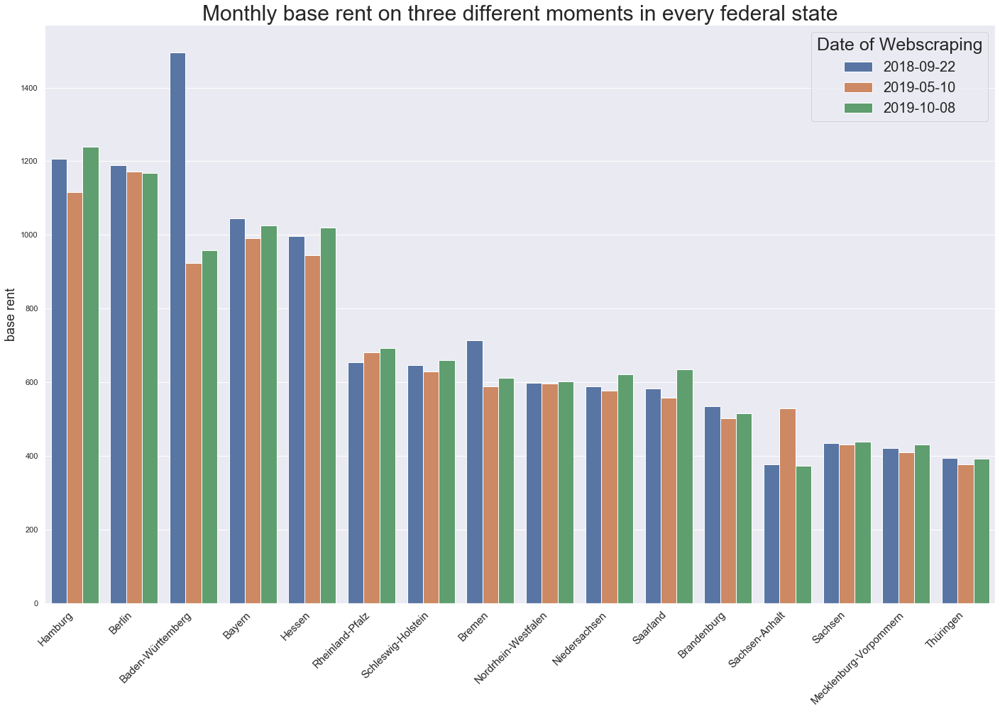

In [471]:
fig, ax = plt.subplots(figsize=(24,15))
ax = sns.barplot(x="regio1", y="baseRent", hue="date", data=immo,ci=False,order=federal_states_desc,ax=ax);
ax.set(xlabel=' ',ylabel='base rent')
ax.set_xticklabels(ax.get_xticklabels(),
                   rotation=45,
                   horizontalalignment='right', fontsize= 15);
ax.set_title('Monthly base rent on three different moments in every federal state', fontsize=30)
ax.set_ylabel(ax.get_ylabel(), fontsize=18) 
#ax.set_
labels=["2018-09-22","2019-05-10", 
        "2019-10-08"]
h, l = ax.get_legend_handles_labels()
ax.legend(h, labels, title="Date of Webscraping",fontsize=20).get_title().set_fontsize(25)

In [472]:
immo['yearConstructed'] = immo['yearConstructed'].fillna(0).astype(int) # 0 means unknown

#### columns to clean: <br/>
<pre>
regio1                 ok <br/>
newlyConst             ok <br/>
balcony                ok <br/>
picturecount           ok <br/>
telekomUploadSpeed     some nans <br/>
totalRent              some nans --> maybe use baseRent more <br/>
yearConstructed        0 means not known  <br/>
baseRent               is comlpete <br/>
livingSpace <br/>
noRooms <br/>
regio2 <br/>
regio3 <br/>
date <br/>
rent_per_sqm
</pre>

In [473]:
immo=immo[immo['noRooms']<10]

In [474]:
immo.shape

(198318, 36)

In [475]:
immo=immo[immo['baseRent']<8000]
immo=immo[immo['baseRent']>100]
immo=immo[immo['yearConstructed']>0]

In [322]:
#sample or groupby, when there are too many rows for plotting

In [476]:
immo_grouped_berlin_09_18=immo[(immo['regio1']=='Berlin') & (immo['date']=='2018-09-22')]
immo_grouped_berlin_09_18.shape

(1717, 36)

In [478]:
immo_grouped_berlin_10_19=immo[(immo['regio1']=='Berlin') & (immo['date']=='2019-10-08')]
immo_grouped_berlin_10_19.shape

(2485, 36)

In [479]:
immo_grouped_berlin_09_18['lift'].replace({True:'Yes',False:'No'}, inplace=True) 

C:\Users\zaruc\Miniconda3\envs\day1\lib\site-packages\pandas\core\generic.py:6786: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


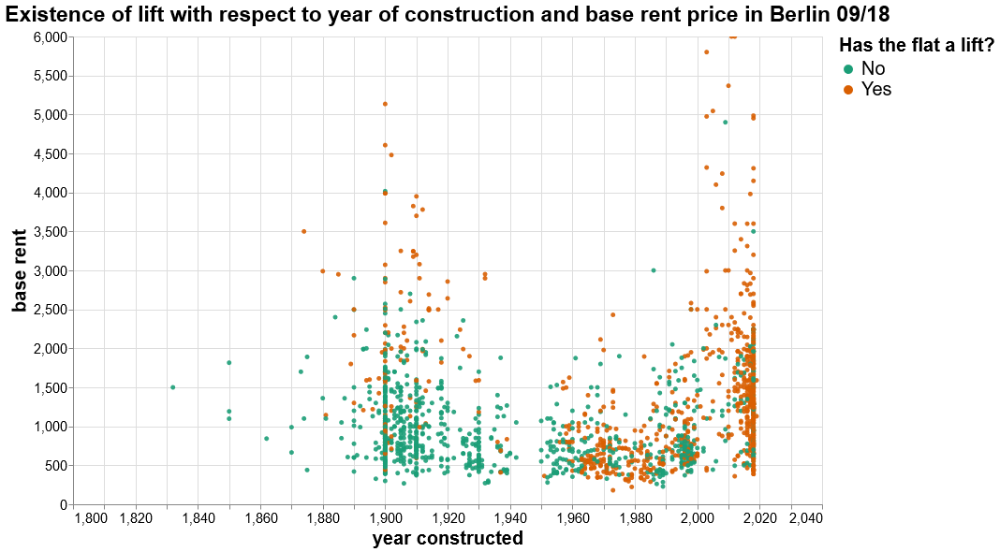

In [480]:
plot_test=alt.Chart(immo_grouped_berlin_09_18,  width=800,height=500,title="Existence of lift with respect to year of construction and base rent price in Berlin 09/18").mark_circle(size=25).encode(
     alt.X('yearConstructed',
        scale=alt.Scale(domain=(1800, 2021)),axis=alt.Axis(title='year constructed')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
    color=alt.Color('lift', legend=alt.Legend(title="Has the flat a lift?",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    #color='balcony',
    tooltip=['description', 'lift', 'yearConstructed', 'baseRent']
).configure_axis(
    labelFontSize=15,
    titleFontSize=20).configure_mark(opacity=0.9).interactive()
plot_test.configure_title(fontSize=23)

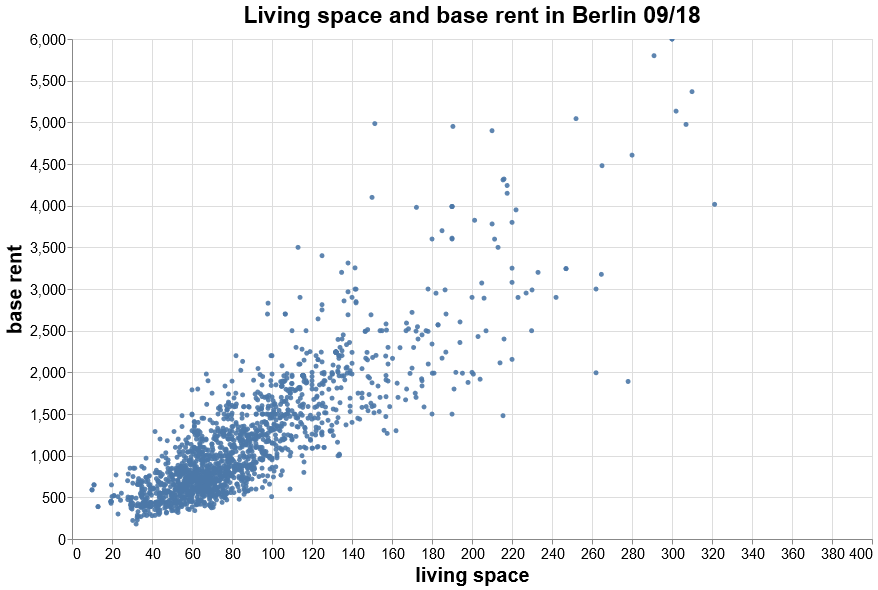

In [481]:
plot_liv_rent=alt.Chart(immo_grouped_berlin_09_18,width=800,height=500, title="Living space and base rent in Berlin 09/18").mark_circle(size=25).encode(
     alt.X('livingSpace',  scale=alt.Scale(domain=(0,400)),
        axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
    tooltip=['description', 'livingSpace', 'baseRent']
).configure_axis(
    labelFontSize=15,
    titleFontSize=20).configure_mark(opacity=0.9).interactive()
plot_liv_rent.configure_title(fontSize=23)


In [482]:
immo_berlin_heat=immo_grouped_berlin_10_19[(immo_grouped_berlin_10_19['heatingType']=='solar_heating')|(immo_grouped_berlin_10_19['heatingType']=='central_heating')|(immo_grouped_berlin_10_19['heatingType']=='floor_heating')|(immo_grouped_berlin_10_19['heatingType']=='gas_heating')]

In [483]:
immo_berlin_heat['heatingType'].value_counts()

central_heating    993
floor_heating      298
gas_heating         89
solar_heating        1
Name: heatingType, dtype: int64

In [484]:
immo_berlin_heat['heatingType'].replace({'central_heating':'central heating', 'floor_heating':'floor heating','gas_heating':'gas heating','solar_heating':'solar heating'}, inplace=True) 

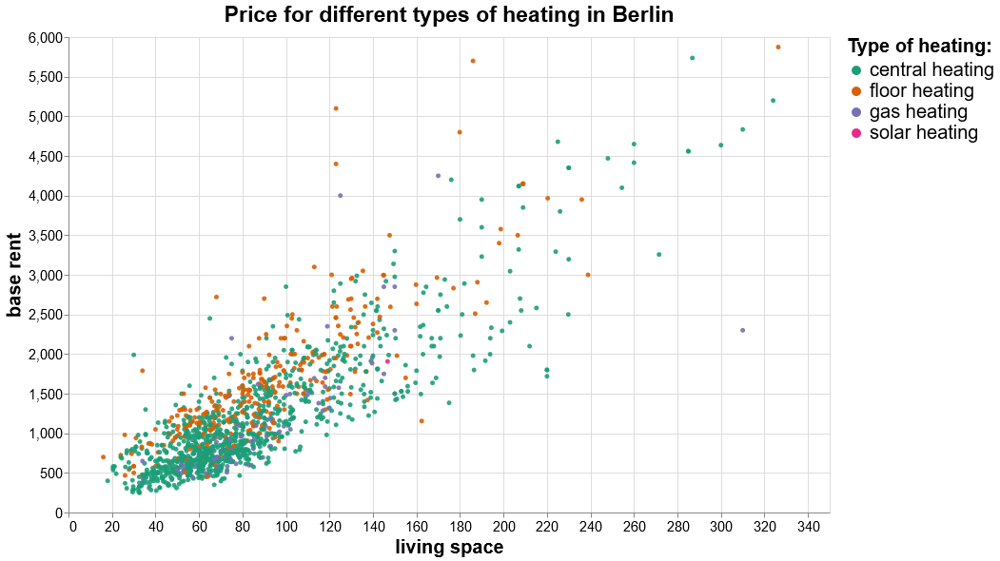

In [485]:
plot_test_heat=alt.Chart(immo_berlin_heat,  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    #color='heatingType',
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).configure_axis(
    labelFontSize=15,
    titleFontSize=20).configure_mark(opacity=0.9).interactive()
plot_test_heat.configure_title(fontSize=23)


In [489]:
immo_norooms=immo.copy()

In [487]:
immo_norooms=immo_norooms[(immo_norooms['noRooms']==0)|(immo_norooms['noRooms']==1)|(immo_norooms['noRooms']==2)|(immo_norooms['noRooms']==3)|(immo_norooms['noRooms']==4)|(immo_norooms['noRooms']==5)|(immo_norooms['noRooms']==6)|(immo_norooms['noRooms']==7)|(immo_norooms['noRooms']==8)]

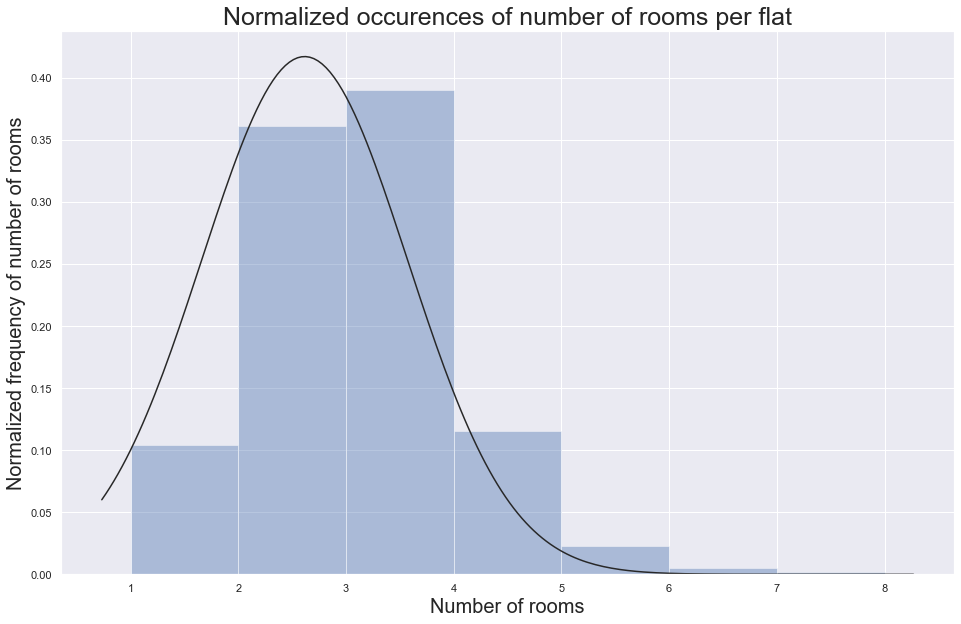

In [488]:
plt.figure(figsize=(16,10))
ax=sns.distplot(immo_norooms['noRooms'],bins=7,fit=norm,kde=False)#,axlabel= 'Number of rooms');#,label='#Rooms');
plt.xlabel('Number of rooms', fontsize=20)
plt.ylabel('Normalized frequency of number of rooms', fontsize=20)
plt.title('Normalized occurences of number of rooms per flat',fontsize=25);

# Visualize Real World Data
### Goal: train python Data Visualization
### GitHub deliverable: .ipynb
### Presentation deliverable: Google slides/Jupyte slides
### Presentation time: ~ 5min
### Target segment: non-technical people (no code display)

## Bonus: D3.JS chart.js

--------------------------------------------

# Presentation structure

## 1) Data description (~ 1 min.)
### Where from?
### Dates?
### How many data points?
### Description of columns
## 2) Story (~ 1 min.)
### Asstumptions/Questions
### Methodology & Tools (optional)
## 3) Plots (~ 2 min.)
### Validations
## 4) Conclusions (~ 1 min.)
### Difficulties & lessons learned

--------------------------------------

# These are tests to fit a linear regression line with Altair
#### It has not worked due to a too low amout of points for the individual heating types(A approximation could not be calculated), but in future projects it can be tried again.
The regression only worked for all of the heating type, but we wanted four seperate lines!

In [490]:
degree_list = [1]#, 3, 5]

# Build a dataframe with the fitted data
poly_data = pd.DataFrame({'xfit': np.linspace(immo_berlin_heat['livingSpace'].min(), immo_berlin_heat['livingSpace'].max(), 500)})
for degree in degree_list:
    poly_data[str(degree)] = np.poly1d(np.polyfit(immo_berlin_heat['livingSpace'], immo_berlin_heat['baseRent'], degree))(poly_data['xfit'])


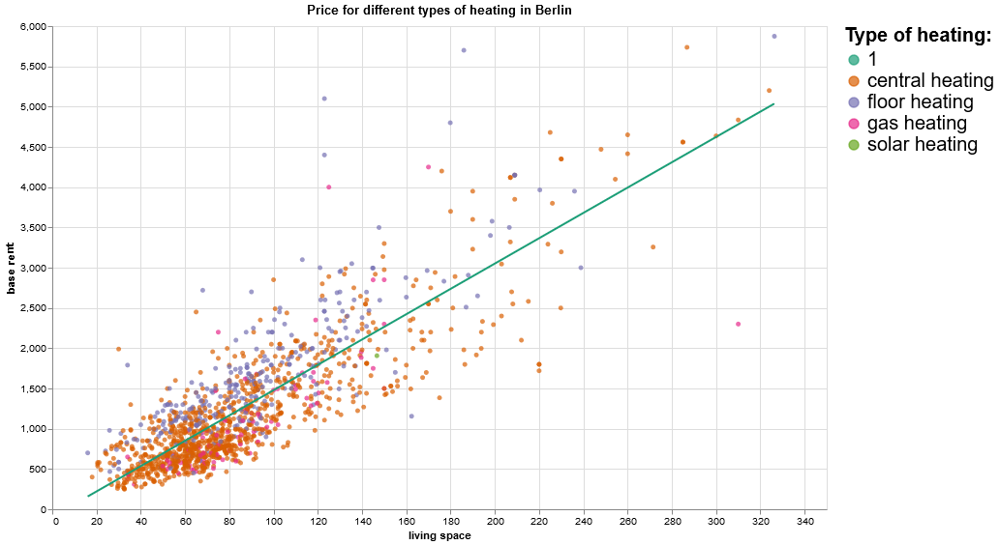

In [491]:
scat=alt.Chart(immo_berlin_heat,  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    #color='heatingType',
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()

poly=alt.Chart(poly_data).transform_fold(
    ['1'],#, '3', '5'],
    as_=['degree', 'yfit']
).mark_line().encode(
    x='xfit:Q',
    y='yfit:Q',
    color='degree:N'
)
scat+poly

In [492]:
immo_berlin_heat['heatingType'].value_counts()

central heating    993
floor heating      298
gas heating         89
solar heating        1
Name: heatingType, dtype: int64

In [493]:
scat_gas=alt.Chart(immo_berlin_heat[immo_berlin_heat['heatingType']=='gas heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()



scat_central=alt.Chart(immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()

scat_floor=alt.Chart(immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()

scat_solar=alt.Chart(immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()



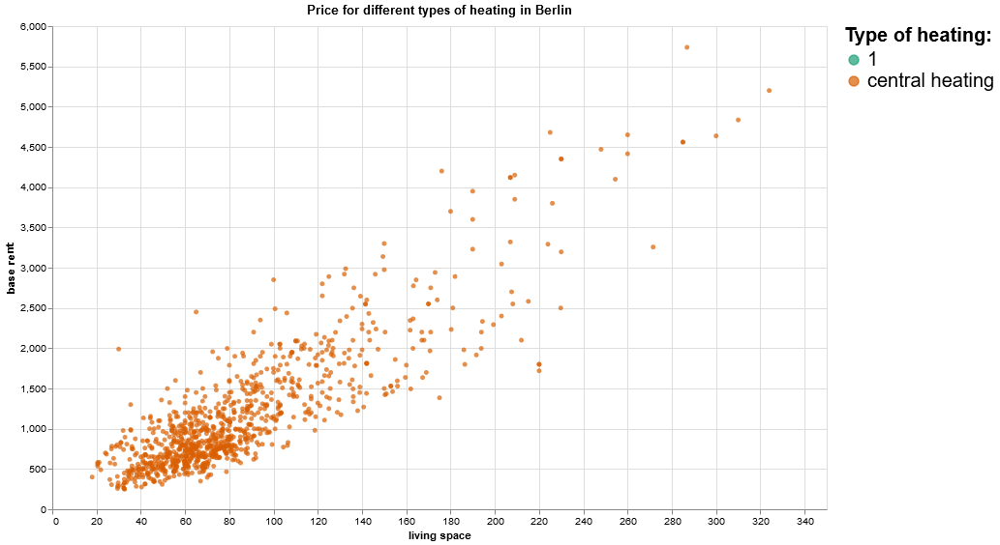

In [494]:
degree_list = [1]

# Build a dataframe with the fitted data
poly_data_gas = pd.DataFrame({'xfit': np.linspace(immo_berlin_heat[immo_berlin_heat['heatingType']=='gas heating']['livingSpace'].min(), immo_berlin_heat[immo_berlin_heat['heatingType']=='gas heating']['livingSpace'].max(), 500)})
for degree in degree_list:
    poly_data[str(degree)] = np.poly1d(np.polyfit(immo_berlin_heat[immo_berlin_heat['heatingType']=='gas heating']['livingSpace'], immo_berlin_heat[immo_berlin_heat['heatingType']=='gas heating']['baseRent'], degree))(poly_data['xfit'])

    
poly_data_solar = pd.DataFrame({'xfit': np.linspace(immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating']['livingSpace'].min(), immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating']['livingSpace'].max(), 500)})
for degree in degree_list:
    poly_data[str(degree)] = np.poly1d(np.polyfit(immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating']['livingSpace'], immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating']['baseRent'], degree))(poly_data['xfit'])

    
    
poly_data_central = pd.DataFrame({'xfit': np.linspace(immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating']['livingSpace'].min(), immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating']['livingSpace'].max(), 500)})
for degree in degree_list:
    poly_data[str(degree)] = np.poly1d(np.polyfit(immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating']['livingSpace'], immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating']['baseRent'], degree))(poly_data['xfit'])

    
    
poly_data_floor = pd.DataFrame({'xfit': np.linspace(immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating']['livingSpace'].min(), immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating']['livingSpace'].max(), 500)})
for degree in degree_list:
    poly_data[str(degree)] = np.poly1d(np.polyfit(immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating']['livingSpace'], immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating']['baseRent'], degree))(poly_data['xfit'])
    
    

poly_gas=alt.Chart(poly_data_gas).transform_fold(
    ['1'],
    as_=['degree', 'yfit']
).mark_line().encode(
    x='xfit:Q',
    y='yfit:Q',
    color='degree:N'
)




poly_central=alt.Chart(poly_data_central).transform_fold(
    ['1'],
    as_=['degree', 'yfit']
).mark_line().encode(
    x='xfit:Q',
    y='yfit:Q',
    color='degree:N'
)



poly_floor=alt.Chart(poly_data_floor).transform_fold(
    ['1'],
    as_=['degree', 'yfit']
).mark_line().encode(
    x='xfit:Q',
    y='yfit:Q',
    color='degree:N'
)



poly_solar=alt.Chart(poly_data_solar).transform_fold(
    ['1'],
    as_=['degree', 'yfit']
).mark_line().encode(
    x='xfit:Q',
    y='yfit:Q',
    color='degree:N'
)

scat_central+poly_central 

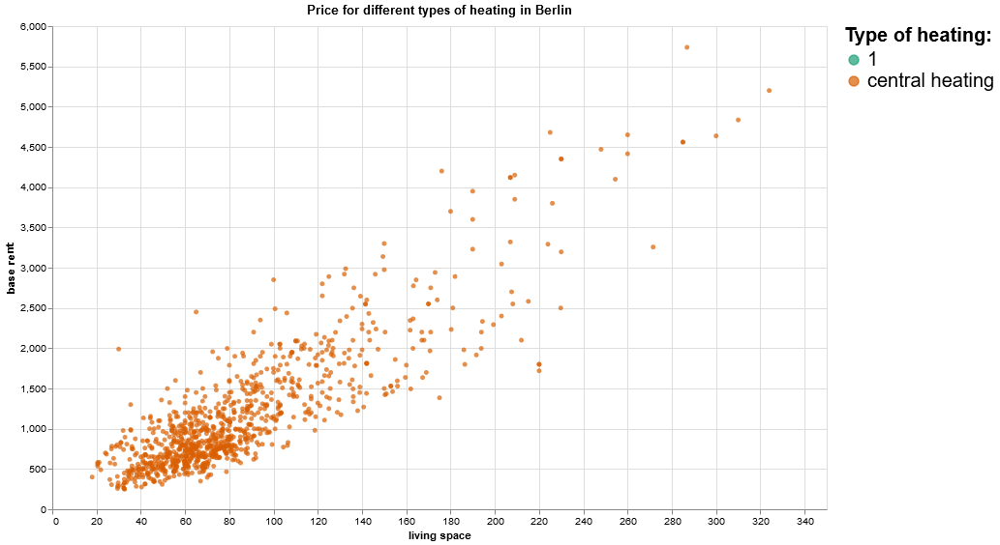

In [495]:
scat_gas=alt.Chart(immo[immo['heatingType']=='gas heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()



scat_central=alt.Chart(immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()

scat_floor=alt.Chart(immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()

scat_solar=alt.Chart(immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()


degree_list = [1]

# Build a dataframe with the fitted data
poly_data_gas = pd.DataFrame({'xfit': np.linspace(immo_berlin_heat[immo_berlin_heat['heatingType']=='gas heating']['livingSpace'].min(), immo_berlin_heat[immo_berlin_heat['heatingType']=='gas heating']['livingSpace'].max(), 500)})
for degree in degree_list:
    poly_data[str(degree)] = np.poly1d(np.polyfit(immo_berlin_heat[immo_berlin_heat['heatingType']=='gas heating']['livingSpace'], immo_berlin_heat[immo_berlin_heat['heatingType']=='gas heating']['baseRent'], degree))(poly_data['xfit'])

    
poly_data_solar = pd.DataFrame({'xfit': np.linspace(immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating']['livingSpace'].min(), immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating']['livingSpace'].max(), 500)})
for degree in degree_list:
    poly_data[str(degree)] = np.poly1d(np.polyfit(immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating']['livingSpace'], immo_berlin_heat[immo_berlin_heat['heatingType']=='solar heating']['baseRent'], degree))(poly_data['xfit'])

    
    
poly_data_central = pd.DataFrame({'xfit': np.linspace(immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating']['livingSpace'].min(), immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating']['livingSpace'].max(), 500)})
for degree in degree_list:
    poly_data[str(degree)] = np.poly1d(np.polyfit(immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating']['livingSpace'], immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating']['baseRent'], degree))(poly_data['xfit'])

    
    
poly_data_floor = pd.DataFrame({'xfit': np.linspace(immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating']['livingSpace'].min(), immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating']['livingSpace'].max(), 500)})
for degree in degree_list:
    poly_data[str(degree)] = np.poly1d(np.polyfit(immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating']['livingSpace'], immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating']['baseRent'], degree))(poly_data['xfit'])
    
    

poly_gas=alt.Chart(poly_data_gas).transform_fold(
    ['1'],
    as_=['degree', 'yfit']
).mark_line().encode(
    x='xfit:Q',
    y='yfit:Q',
    color='degree:N'
)




poly_central=alt.Chart(poly_data_central).transform_fold(
    ['1'],
    as_=['degree', 'yfit']
).mark_line().encode(
    x='xfit:Q',
    y='yfit:Q',
    color='degree:N'
)



poly_floor=alt.Chart(poly_data_floor).transform_fold(
    ['1'],
    as_=['degree', 'yfit']
).mark_line().encode(
    x='xfit:Q',
    y='yfit:Q',
    color='degree:N'
)



poly_solar=alt.Chart(poly_data_solar).transform_fold(
    ['1'],
    as_=['degree', 'yfit']
).mark_line().encode(
    x='xfit:Q',
    y='yfit:Q',
    color='degree:N'
)

scat_central+poly_central 

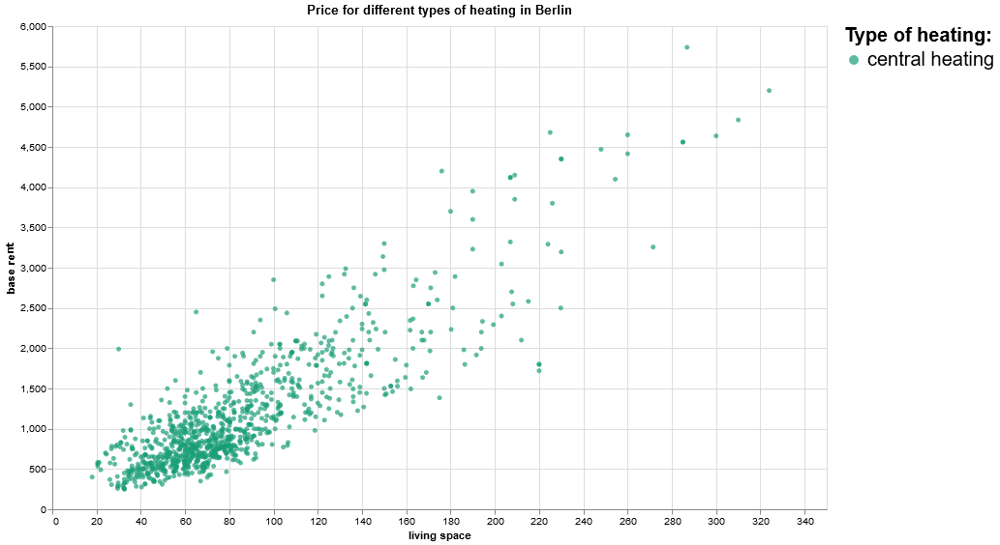

In [496]:
scat_central=alt.Chart(immo_berlin_heat[immo_berlin_heat['heatingType']=='central heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()

scat_floor=alt.Chart(immo_berlin_heat[immo_berlin_heat['heatingType']=='floor heating'],  width=800,height=500, title="Price for different types of heating in Berlin").mark_circle(size=25).encode(
     alt.X('livingSpace',axis=alt.Axis(title='living space')),
     alt.Y('baseRent', scale=alt.Scale(domain=(0, 6000)),axis=alt.Axis(title='base rent')),
     color=alt.Color('heatingType', legend=alt.Legend(title="Type of heating:",titleFontSize=20, labelFontSize=20),scale=alt.Scale(scheme='dark2')),
    tooltip=['description', 'heatingType', 'livingSpace', 'baseRent']
).interactive()
scat_central

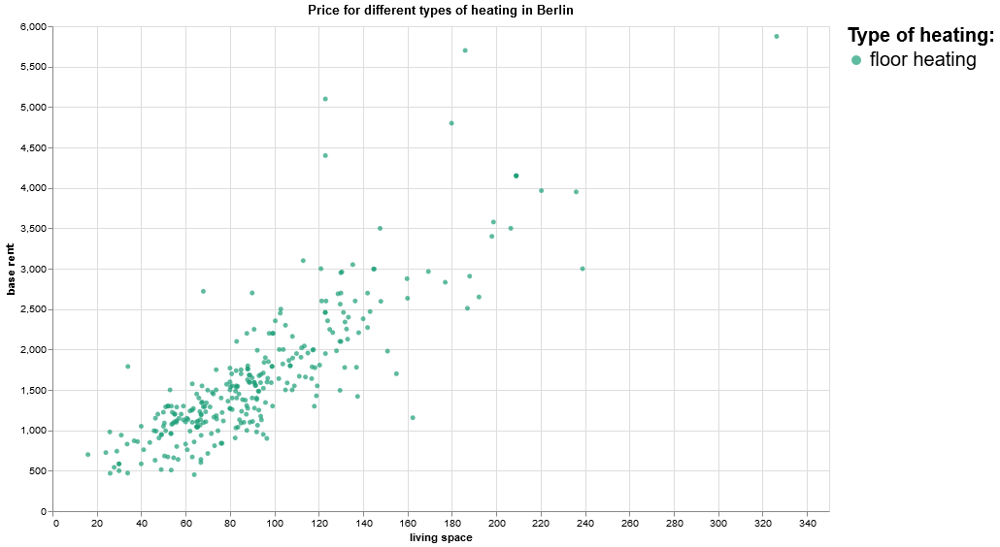

In [497]:
scat_floor